# Eval similarity metrics

In [2]:
%matplotlib inline
import pickle
from os import listdir, makedirs
from os.path import join, isfile, exists, dirname
import gc
import re
import math

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns
%pylab inline
import numpy as np
import pandas as pd
from gensim.corpora import Dictionary, MmCorpus
from gensim.models import TfidfModel, LdaModel
from gensim.models import Word2Vec, Doc2Vec, FastText
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel
from tqdm._tqdm_notebook import tqdm_notebook

from constants import *
from utils import load, init_logging, tprint, TopicsLoader
from topic_reranking import Reranker

#from eval_lda import eval_coherence

tqdm_notebook.pandas()
pd.options.display.max_columns = 50
pd.options.display.max_rows = 200

Populating the interactive namespace from numpy and matplotlib


-----

### comparing to gold standard

In [47]:
sim_gold = load('similarity').drop([str(i) for i in range(1, 14)] + ['Original1', 'Original2', 'Lemma1', 'Lemma2', 'avg', 'stdv'], axis=1)
sim_pred = load('similarity', 'scores')
sim_pred[['jcn', 'jcn_ignr_unkwn']] *= -1
sim = sim_gold.join(sim_pred).query('POS1 == "n" and POS2 == "n" and Problematic != True')
sim

Reading ../data/preprocessed/similarity_datasets.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/similarity_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/similarity_noun_bow_topic-scores_germanet.csv


POS1 POS2 Similarity Relatedness Problematic  Gold  u_mass_wikt  c_v_wikt  c_npmi_wikt  c_uci_wikt  c_uci_wikt_w20  c_w2v_w2v  c_w2v_ftx  mean_similarity_d2v  mean_similarity_w2v  mean_similarity_ftx  pairwise_similarity_d2v  pairwise_similarity_w2v  pairwise_similarity_ftx  pairwise_similarity_ignore_oov_d2v  pairwise_similarity_ignore_oov_w2v  pairwise_similarity_ignore_oov_ftx    lch  lch_ignr_unkwn        res  res_ignr_unkwn     jcn  jcn_ignr_unkwn        lin  lin_ignr_unkwn
dataset      topic_idx                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
SimLex999_de 111          n    n       TRUE         NaN         NaN  6.62   -2.452e+00     0.889        0.236       2.471           2.364      0.933      0.945                  NaN                0.933                0.945                      NaN                    0.871                    0.892                                 NaN                               0.871                               0.892  2.639           1.320  5.459e+00       2.730e+00  -4.134          -2.067  7.254e-01       3.627e-01
             112          n    n       TRUE         NaN         NaN  6.23   -2.057e+00     0.830        0.151       1.406           1.351      0.880      0.883                0.765                0.880                0.883                    0.598                    0.776                    0.779                               0.598                               0.776                               0.779  1.173           0.586 -6.661e-15      -3.331e-15 -11.673          -5.836 -8.979e-16      -4.490e-16
             113          n    n       TRUE         NaN         NaN  6.38   -9.218e-01     0.971        0.607       6.749           6.318      0.943      0.951                  NaN                0.943                0.951                      NaN                    0.890                    0.905                                 NaN                               0.890                               0.905  2.639           1.320  5.459e+00       2.730e+00 -11.820          -5.910  4.802e-01       2.401e-01
             114          n    n       TRUE         NaN         NaN  4.77   -7.651e-01     0.839        0.237       2.104           1.856      0.905      0.911                0.798                0.905                0.911                    0.639                    0.822                    0.832                               0.639                               0.822                               0.832  1.173           0.586 -6.661e-15      -3.331e-15 -14.445          -7.222 -8.550e-16      -4.275e-16
             115          n    n       TRUE         NaN         NaN  3.92   -4.592e-01     0.966        0.548       3.491           3.293      0.998      0.998                0.762                0.998                0.998                    0.582                    0.996                    0.996                               0.582                               0.996                               0.996  2.639           1.320  7.566e+00       3.783e+00  -2.761          -1.381  8.457e-01       4.228e-01
             116          n    n       TRUE         NaN         NaN  5.85   -2.108e+00     0.895        0.283       2.911           2.881      0.880      0.895                0.791                0.880                0.895                    0.632                    0.776                    0.801                               0.632                               0.776                               0.801  1.253           0.626 -6.661e-15      -3.331e-15 -17.625          -

In [48]:
def gold_correlation(df, method='pearson'):
    df = df.copy()
    correlations = dict()
    for col in df.columns[1:]:
        if 'ign' in col:
            continue
        tmp = df.loc[:, ['Gold', col]]
        tmp = tmp.dropna()
        corr = tmp.corr(method)
        correlations[col] = corr.loc['Gold', col]
    return pd.Series(correlations)

def get_corr(datasets=None, method='pearson'):
    if datasets is not None:
        queried = sim.query('dataset in @datasets')
        print(len(queried))
    else:
        queried = sim.copy()
        print(len(queried))

    noun_scores = queried.loc[:, 'Gold':]
    similar_scores = queried.query('Problematic != True and Similarity == Similarity').loc[:, 'Gold':].copy()
    related_scores = queried.query('Problematic != True and Relatedness == Relatedness').loc[:, 'Gold':].copy()

    noun_preason = gold_correlation(noun_scores, method=method)
    similar_preason = gold_correlation(similar_scores, method=method)
    related_preason = gold_correlation(related_scores, method=method)
    
    sers = [noun_preason, similar_preason, related_preason]
    corrs = pd.concat(sers, axis=1)
    corrs.columns = ['all', 'similarity', 'relatedness']
    return corrs


-----

#### Pearson r

In [49]:
corrs_all = get_corr()
corrs_all.sort_values('relatedness', ascending=False)

1604


,all,similarity,relatedness
c_npmi_wikt,0.506,0.443,0.606
mean_similarity_w2v,0.491,0.487,0.560
c_v_wikt,0.471,0.402,0.551
pairwise_similarity_w2v,0.487,0.489,0.550
c_uci_wikt,0.457,0.402,0.531
mean_similarity_ftx,0.489,0.496,0.528
pairwise_similarity_ftx,0.488,0.496,0.526
c_uci_wikt_w20,0.423,0.368,0.490
mean_similarity_d2v,0.351,0.338,0.394
pairwise_similarity_d2v,0.329,0.329,0.363


In [50]:
corrs_all = get_corr()
corrs_all.sort_values('similarity', ascending=False)

1604


,all,similarity,relatedness
mean_similarity_ftx,0.489,0.496,0.528
pairwise_similarity_ftx,0.488,0.496,0.526
pairwise_similarity_w2v,0.487,0.489,0.550
mean_similarity_w2v,0.491,0.487,0.560
lch,0.364,0.484,0.298
lin,0.359,0.464,0.310
c_w2v_ftx,0.327,0.462,0.237
c_w2v_w2v,0.325,0.448,0.247
c_npmi_wikt,0.506,0.443,0.606
jcn,0.329,0.436,0.264


In [51]:
# SimLex Only
corrs_simlex = get_corr(['SimLex999_de'])
corrs_simlex.sort_values('similarity', ascending=False)

653


,all,similarity,relatedness
mean_similarity_ftx,0.454,0.454,NaN
pairwise_similarity_ftx,0.449,0.449,NaN
lch,0.438,0.438,NaN
mean_similarity_w2v,0.437,0.437,NaN
pairwise_similarity_w2v,0.434,0.434,NaN
c_w2v_ftx,0.417,0.417,NaN
c_w2v_w2v,0.396,0.396,NaN
lin,0.393,0.393,NaN
jcn,0.372,0.372,NaN
c_npmi_wikt,0.348,0.348,NaN


In [52]:
# WordSim Only
corrs_wordsim = get_corr(['WS353_de'])
corrs_wordsim.sort_values('relatedness', ascending=False)

327


,all,similarity,relatedness
c_npmi_wikt,0.643,0.666,0.659
pairwise_similarity_w2v,0.642,0.711,0.608
c_v_wikt,0.602,0.626,0.600
mean_similarity_w2v,0.634,0.697,0.600
pairwise_similarity_ftx,0.631,0.705,0.587
mean_similarity_ftx,0.625,0.696,0.581
c_uci_wikt,0.562,0.577,0.544
c_w2v_w2v,0.590,0.640,0.524
c_w2v_ftx,0.582,0.642,0.512
c_uci_wikt_w20,0.516,0.528,0.494


In [53]:
# WordSim Only
corrs_wordsim.sort_values('similarity', ascending=False)

,all,similarity,relatedness
pairwise_similarity_w2v,0.642,0.711,0.608
pairwise_similarity_ftx,0.631,0.705,0.587
mean_similarity_w2v,0.634,0.697,0.600
mean_similarity_ftx,0.625,0.696,0.581
lch,0.406,0.688,0.088
lin,0.415,0.671,0.111
res,0.413,0.667,0.095
c_npmi_wikt,0.643,0.666,0.659
c_w2v_ftx,0.582,0.642,0.512
c_w2v_w2v,0.590,0.640,0.524


In [54]:
# Gur Only
corrs_gur = get_corr(['gur222', 'gur350', 'gur65'])
corrs_gur.sort_values('relatedness', ascending=False)

351


,all,similarity,relatedness
pairwise_similarity_ftx,0.667,0.797,0.650
pairwise_similarity_w2v,0.654,0.768,0.648
mean_similarity_ftx,0.660,0.790,0.645
mean_similarity_w2v,0.634,0.762,0.634
c_npmi_wikt,0.611,0.751,0.580
c_uci_wikt,0.549,0.663,0.520
lin,0.578,0.782,0.520
pairwise_similarity_d2v,0.518,0.571,0.493
c_uci_wikt_w20,0.524,0.662,0.486
c_v_wikt,0.478,0.680,0.472


In [55]:
corrs_gur.sort_values('similarity', ascending=False)

,all,similarity,relatedness
pairwise_similarity_ftx,0.667,0.797,0.650
c_w2v_ftx,0.328,0.790,0.256
mean_similarity_ftx,0.660,0.790,0.645
lin,0.578,0.782,0.520
lch,0.533,0.770,0.467
pairwise_similarity_w2v,0.654,0.768,0.648
jcn,0.523,0.766,0.450
res,0.533,0.762,0.471
mean_similarity_w2v,0.634,0.762,0.634
c_w2v_w2v,0.287,0.762,0.224


In [56]:
# Schm280 Only
corrs_schm = get_corr(['Schm280'])
corrs_schm.sort_values('relatedness', ascending=False)

273


,all,similarity,relatedness
mean_similarity_w2v,0.692,NaN,0.692
pairwise_similarity_w2v,0.690,NaN,0.690
pairwise_similarity_ftx,0.672,NaN,0.672
mean_similarity_ftx,0.672,NaN,0.672
c_w2v_w2v,0.665,NaN,0.665
c_w2v_ftx,0.646,NaN,0.646
c_npmi_wikt,0.642,NaN,0.642
c_v_wikt,0.632,NaN,0.632
c_uci_wikt,0.566,NaN,0.566
c_uci_wikt_w20,0.523,NaN,0.523


In [57]:
# all except SimLex
corrs_wosl = get_corr(['WS353_de', 'Schm280', 'gur222', 'gur350', 'gur65'])
corrs_wosl.sort_values('relatedness', ascending=False)

951


,all,similarity,relatedness
c_npmi_wikt,0.605,0.618,0.606
mean_similarity_w2v,0.558,0.603,0.560
c_v_wikt,0.549,0.555,0.551
pairwise_similarity_w2v,0.554,0.618,0.550
c_uci_wikt,0.534,0.532,0.531
mean_similarity_ftx,0.535,0.596,0.528
pairwise_similarity_ftx,0.536,0.606,0.526
c_uci_wikt_w20,0.498,0.501,0.490
mean_similarity_d2v,0.414,0.478,0.394
pairwise_similarity_d2v,0.374,0.430,0.363


In [58]:
corrs_wosl.sort_values('similarity', ascending=False)

,all,similarity,relatedness
c_npmi_wikt,0.605,0.618,0.606
pairwise_similarity_w2v,0.554,0.618,0.550
pairwise_similarity_ftx,0.536,0.606,0.526
mean_similarity_w2v,0.558,0.603,0.560
lin,0.379,0.600,0.310
mean_similarity_ftx,0.535,0.596,0.528
lch,0.357,0.572,0.298
c_w2v_w2v,0.298,0.570,0.247
c_w2v_ftx,0.289,0.568,0.237
res,0.370,0.567,0.316


In [60]:
survey_gold = load('survey').Gold
survey_pred = load('survey', 'scores')
survey = pd.concat([survey_gold, survey_pred], axis=1)
survey[['jcn', 'jcn_ignr_unkwn']] *= -1
gold_correlation(survey).sort_values(ascending=False)

Reading ../data/preprocessed/LDAmodel/noun/bow/topics/survey_topics.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/survey_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/survey_noun_bow_topic-scores_germanet.csv


c_v_wikt                   0.807
c_npmi_wikt                0.807
c_uci_wikt                 0.791
c_uci_wikt_w20             0.774
c_w2v_ftx                  0.769
mean_similarity_ftx        0.766
pairwise_similarity_ftx    0.759
pairwise_similarity_w2v    0.756
c_w2v_w2v                  0.753
mean_similarity_w2v        0.753
u_mass_wikt                0.622
pairwise_similarity_d2v    0.501
mean_similarity_d2v        0.405
jcn                        0.400
lin                        0.316
lch                        0.245
res                        0.215
dtype: float64

-----

#### Kendall tau

In [27]:
corrs_all = get_corr(method='kendall').sort_values('relatedness', ascending=False)
corrs_all

1604


,all,similarity,relatedness
c_npmi_wikt,0.364,0.306,0.465
c_uci_wikt,0.343,0.284,0.449
c_v_wikt,0.356,0.302,0.443
c_uci_wikt_w20,0.338,0.279,0.443
mean_similarity_w2v,0.345,0.336,0.413
pairwise_similarity_w2v,0.347,0.341,0.413
pairwise_similarity_ftx,0.343,0.341,0.383
mean_similarity_ftx,0.341,0.339,0.380
c_w2v_w2v,0.282,0.323,0.297
c_w2v_ftx,0.272,0.327,0.268


In [28]:
# SimLex Only
corrs_simlex = get_corr(['SimLex999_de'], method='kendall').sort_values('similarity', ascending=False)
corrs_simlex

653


,all,similarity,relatedness
lch,0.307,0.307,NaN
pairwise_similarity_ftx,0.303,0.303,NaN
mean_similarity_ftx,0.302,0.302,NaN
pairwise_similarity_w2v,0.297,0.297,NaN
mean_similarity_w2v,0.293,0.293,NaN
c_w2v_ftx,0.288,0.288,NaN
c_w2v_w2v,0.279,0.279,NaN
lin,0.277,0.277,NaN
jcn,0.270,0.270,NaN
c_v_wikt,0.231,0.231,NaN


In [29]:
# WordSim Only
corrs_simlex = get_corr(['WS353_de'], method='kendall').sort_values('relatedness', ascending=False)
corrs_simlex

327


,all,similarity,relatedness
c_npmi_wikt,0.492,0.519,0.508
c_uci_wikt_w20,0.471,0.496,0.490
c_v_wikt,0.481,0.500,0.485
c_uci_wikt,0.467,0.503,0.482
pairwise_similarity_w2v,0.469,0.511,0.433
mean_similarity_w2v,0.462,0.505,0.422
pairwise_similarity_ftx,0.453,0.502,0.413
c_w2v_w2v,0.449,0.487,0.407
mean_similarity_ftx,0.447,0.496,0.405
c_w2v_ftx,0.432,0.479,0.389


In [30]:
# Gur Only
corrs_simlex = get_corr(['gur222', 'gur350', 'gur65'], method='kendall').sort_values('relatedness', ascending=False)
corrs_simlex

351


,all,similarity,relatedness
pairwise_similarity_w2v,0.488,0.590,0.494
pairwise_similarity_ftx,0.487,0.617,0.476
mean_similarity_w2v,0.469,0.589,0.475
mean_similarity_ftx,0.482,0.610,0.472
c_npmi_wikt,0.448,0.588,0.426
c_uci_wikt,0.434,0.593,0.408
c_uci_wikt_w20,0.432,0.591,0.406
c_v_wikt,0.415,0.606,0.401
pairwise_similarity_d2v,0.360,0.384,0.357
lin,0.374,0.515,0.344


In [31]:
# Schm280 Only
corrs_simlex = get_corr(['Schm280'], method='kendall').sort_values('relatedness', ascending=False)
corrs_simlex

273


,all,similarity,relatedness
pairwise_similarity_w2v,0.535,NaN,0.535
mean_similarity_w2v,0.527,NaN,0.527
c_w2v_w2v,0.518,NaN,0.518
c_v_wikt,0.512,NaN,0.512
c_npmi_wikt,0.510,NaN,0.510
pairwise_similarity_ftx,0.506,NaN,0.506
mean_similarity_ftx,0.499,NaN,0.499
c_uci_wikt_w20,0.492,NaN,0.492
c_w2v_ftx,0.490,NaN,0.490
c_uci_wikt,0.488,NaN,0.488


In [32]:
# all except SimLex
corrs_simlex = get_corr(['WS353_de', 'Schm280', 'gur222', 'gur350', 'gur65'], method='kendall').sort_values('relatedness', ascending=False)
corrs_simlex

951


,all,similarity,relatedness
c_npmi_wikt,0.459,0.462,0.465
c_uci_wikt,0.440,0.441,0.449
c_v_wikt,0.437,0.435,0.443
c_uci_wikt_w20,0.433,0.431,0.443
mean_similarity_w2v,0.406,0.416,0.413
pairwise_similarity_w2v,0.407,0.420,0.413
pairwise_similarity_ftx,0.385,0.413,0.383
mean_similarity_ftx,0.382,0.407,0.380
c_w2v_w2v,0.309,0.407,0.297
c_w2v_ftx,0.284,0.402,0.268


In [34]:
gold_correlation(survey, method='kendall').sort_values(ascending=False)

c_v_wikt                   0.608
c_npmi_wikt                0.601
c_uci_wikt                 0.572
c_uci_wikt_w20             0.557
pairwise_similarity_ftx    0.550
mean_similarity_ftx        0.550
c_w2v_ftx                  0.543
pairwise_similarity_w2v    0.537
mean_similarity_w2v        0.525
c_w2v_w2v                  0.525
pairwise_similarity_d2v    0.313
mean_similarity_d2v        0.270
jcn                        0.256
lin                        0.210
res                        0.151
lch                        0.129
dtype: float64

------

### inter score correlation

can be ignored

In [2]:
dfs = [load('dewac', 'scores'), load('dewac1', 'scores'), load('dewiki', 'scores'), load('E', 'scores'), load('FA', 'scores'), load('FO', 'scores'), load('N', 'scores'), load('P', 'scores'), load('O', 'scores'), load('S', 'scores')]
s = pd.concat(dfs)
s = s.replace([np.inf, -np.inf], np.nan)
s[['jcn', 'jcn_ignr_unkwn']] *= -1
col_mean = s.mean()
col_stdv = s.std()
col_mean, col_stdv
inds = np.where(np.isnan(s.values))
s.values[inds] = np.take(col_mean.values, inds[1])

Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac1_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac1_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewiki_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewiki_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/Europarl_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/Europarl_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FAZ_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FAZ_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FOCUS_noun_bow_topic-scores.csv
Rea

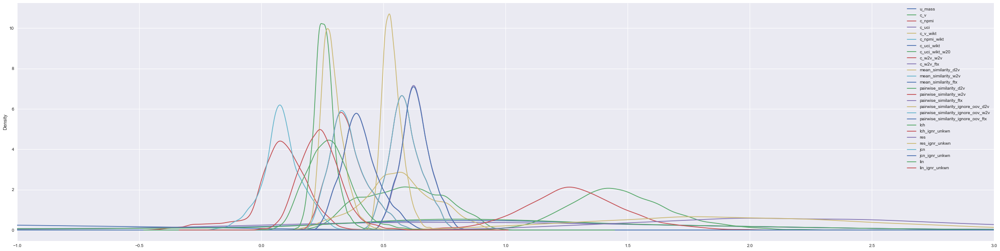

In [3]:
sns.set()
pylab.rcParams['figure.figsize'] = (40, 10)
s.plot(kind='density', xlim=(-1, 3))

In [4]:
s_norm = (s - col_mean) / col_stdv

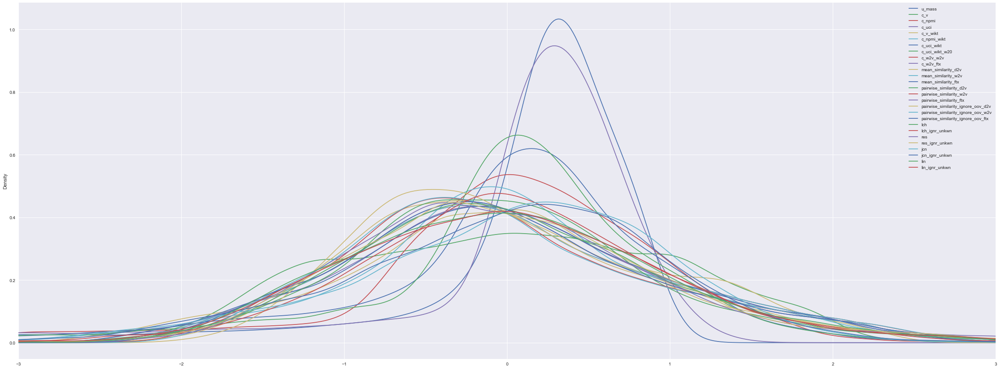

In [5]:
sns.set()
pylab.rcParams['figure.figsize'] = (40, 15)

if False:
    mu = 0
    variance = 1
    sigma = math.sqrt(variance)
    x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
    plt.plot(x,mlab.normpdf(x, mu, sigma))

s_norm.plot.density(xlim=(-3, 3))

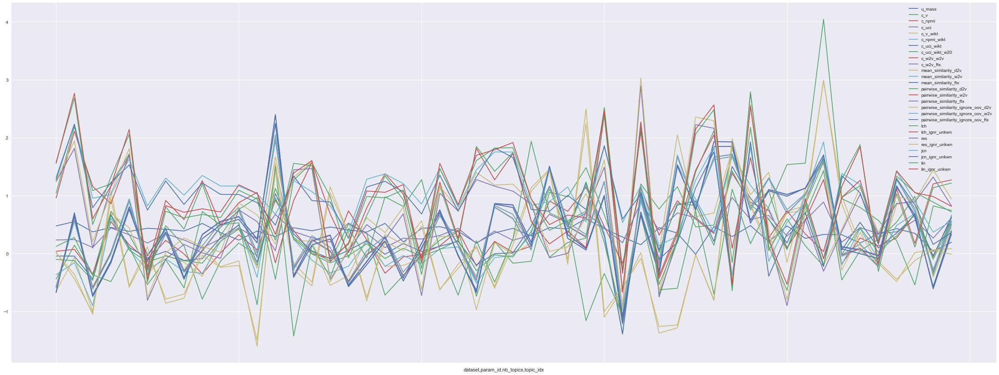

In [6]:
s_norm.iloc[:50, :].plot()

<Figure size 2880x1080 with 0 Axes>

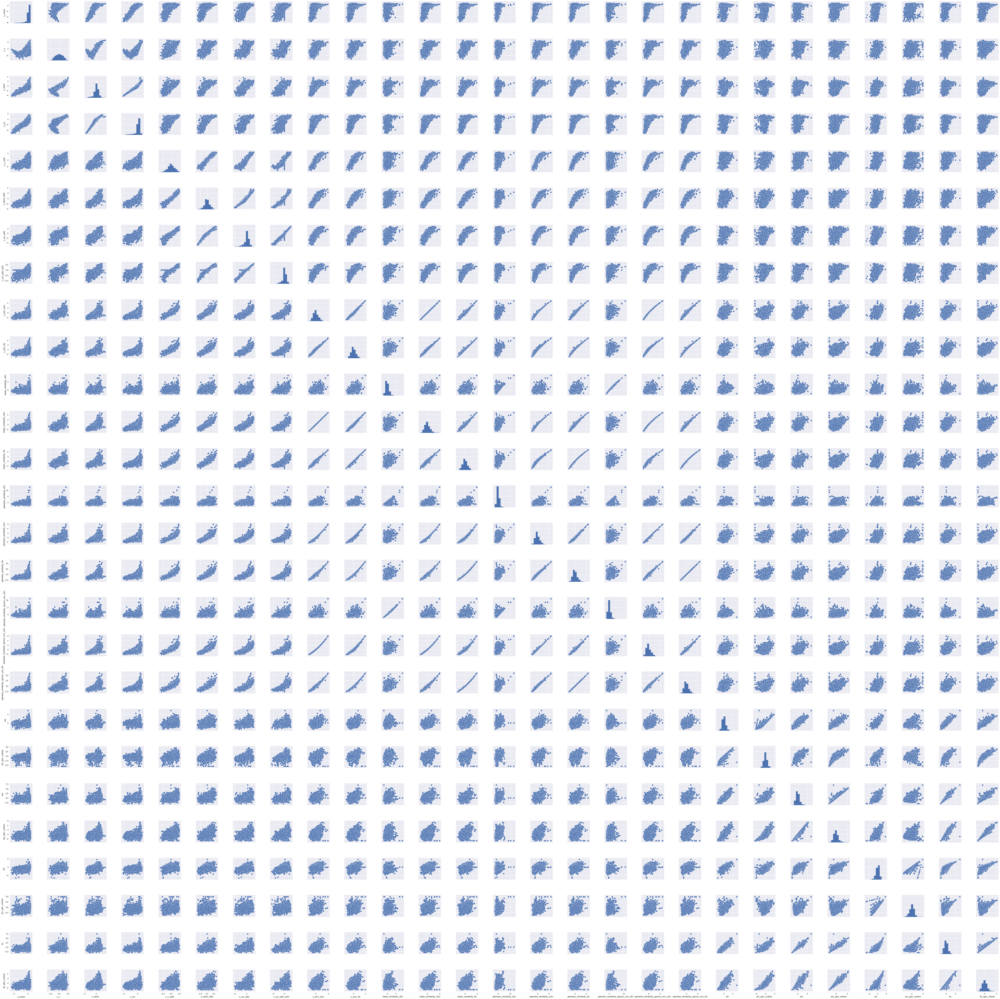

In [7]:
plt.tight_layout()
sns.pairplot(s_norm)

In [8]:
pearson = s.corr(method='pearson')
print(pearson.mean().sort_values(ascending=False))
pearson

mean_similarity_ftx                   0.678
c_w2v_ftx                             0.677
pairwise_similarity_ftx               0.673
pairwise_similarity_ignore_oov_ftx    0.673
c_w2v_w2v                             0.672
mean_similarity_w2v                   0.672
pairwise_similarity_w2v               0.667
pairwise_similarity_ignore_oov_w2v    0.665
c_npmi_wikt                           0.650
c_v_wikt                              0.644
c_uci_wikt                            0.618
c_uci_wikt_w20                        0.601
c_npmi                                0.568
c_uci                                 0.548
c_v                                   0.531
lin                                   0.517
lin_ignr_unkwn                        0.513
res_ignr_unkwn                        0.499
res                                   0.491
jcn                                   0.435
u_mass                                0.425
lch                                   0.413
lch_ignr_unkwn                  

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.369,0.708,0.884,0.522,0.554,0.679,0.647,0.423,0.464,0.167,0.423,0.468,0.260,0.397,0.435,0.150,0.386,0.435,0.144,0.235,0.135,0.184,0.485,0.357,0.264,0.296
c_v,0.369,1.000,0.861,0.687,0.772,0.755,0.675,0.663,0.722,0.681,0.295,0.722,0.681,0.231,0.717,0.681,0.287,0.719,0.681,0.230,0.220,0.356,0.360,0.191,0.158,0.318,0.315
c_npmi,0.708,0.861,1.000,0.930,0.773,0.792,0.777,0.755,0.706,0.688,0.307,0.706,0.688,0.287,0.688,0.674,0.294,0.686,0.674,0.221,0.243,0.326,0.344,0.301,0.235,0.335,0.341
c_uci,0.884,0.687,0.930,1.000,0.713,0.735,0.793,0.763,0.628,0.635,0.234,0.628,0.638,0.307,0.603,0.612,0.217,0.596,0.612,0.224,0.283,0.278,0.314,0.431,0.328,0.348,0.369
c_v_wikt,0.522,0.772,0.773,0.713,1.000,0.965,0.894,0.881,0.911,0.887,0.380,0.911,0.894,0.383,0.907,0.885,0.362,0.898,0.885,0.232,0.254,0.393,0.413,0.287,0.223,0.376,0.386
c_npmi_wikt,0.554,0.755,0.792,0.735,0.965,1.000,0.951,0.932,0.889,0.873,0.410,0.889,0.878,0.394,0.883,0.869,0.392,0.877,0.869,0.249,0.264,0.392,0.410,0.311,0.248,0.380,0.387
c_uci_wikt,0.679,0.675,0.777,0.793,0.894,0.951,1.000,0.976,0.775,0.784,0.358,0.775,0.791,0.378,0.762,0.770,0.338,0.751,0.770,0.242,0.292,0.333,0.367,0.398,0.295,0.366,0.386
c_uci_wikt_w20,0.647,0.663,0.755,0.763,0.881,0.932,0.976,1.000,0.758,0.763,0.361,0.758,0.768,0.359,0.743,0.748,0.342,0.735,0.748,0.227,0.273,0.328,0.358,0.362,0.262,0.348,0.365
c_w2v_w2v,0.423,0.722,0.706,0.628,0.911,0.889,0.775,0.758,1.000,0.980,0.411,1.000,0.978,0.446,0.993,0.979,0.397,0.996,0.979,0.348,0.311,0.477,0.475,0.326,0.320,0.466,0.456
c_w2v_ftx,0.464,0.681,0.688,0.635,0.887,0.873,0.784,0.763,0.980,1.000,0.435,0.980,0.997,0.467,0.972,0.995,0.419,0.975,0.995,0.353,0.331,0.462,0.467,0.375,0.353,0.473,0.469


In [9]:
kendall = s.corr(method='kendall')
print(kendall.mean().sort_values(ascending=False))
kendall

pairwise_similarity_ftx               0.552
pairwise_similarity_ignore_oov_ftx    0.552
pairwise_similarity_w2v               0.552
c_w2v_w2v                             0.552
mean_similarity_w2v                   0.552
pairwise_similarity_ignore_oov_w2v    0.552
mean_similarity_ftx                   0.551
c_w2v_ftx                             0.550
c_npmi_wikt                           0.512
c_v_wikt                              0.508
c_uci_wikt                            0.484
c_uci_wikt_w20                        0.474
c_uci                                 0.431
c_npmi                                0.428
c_v                                   0.402
lin_ignr_unkwn                        0.388
lin                                   0.387
res_ignr_unkwn                        0.371
res                                   0.361
jcn                                   0.303
lch_ignr_unkwn                        0.301
lch                                   0.294
jcn_ignr_unkwn                  

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.029,0.096,0.136,0.153,0.176,0.215,0.194,0.119,0.165,1.177e-01,0.119,0.165,0.133,0.122,0.166,0.114,0.120,0.166,-0.006,1.789e-02,-0.038,-0.024,0.235,0.208,0.063,0.071
c_v,0.029,1.000,0.819,0.747,0.598,0.579,0.536,0.535,0.535,0.490,1.752e-01,0.535,0.492,0.154,0.534,0.492,0.169,0.535,0.492,0.154,1.632e-01,0.240,0.247,0.093,0.079,0.214,0.216
c_npmi,0.096,0.819,1.000,0.868,0.616,0.628,0.586,0.579,0.553,0.514,2.061e-01,0.553,0.516,0.187,0.553,0.517,0.199,0.553,0.517,0.160,1.713e-01,0.248,0.256,0.111,0.094,0.227,0.231
c_uci,0.136,0.747,0.868,1.000,0.602,0.618,0.605,0.587,0.546,0.519,1.964e-01,0.546,0.520,0.207,0.546,0.521,0.188,0.546,0.521,0.174,1.904e-01,0.239,0.251,0.154,0.129,0.238,0.244
c_v_wikt,0.153,0.598,0.616,0.602,1.000,0.858,0.784,0.797,0.758,0.709,2.655e-01,0.758,0.717,0.263,0.771,0.719,0.257,0.759,0.719,0.139,1.592e-01,0.260,0.273,0.149,0.132,0.249,0.256
c_npmi_wikt,0.176,0.579,0.628,0.618,0.858,1.000,0.879,0.856,0.731,0.695,2.827e-01,0.731,0.702,0.277,0.741,0.704,0.274,0.732,0.704,0.150,1.706e-01,0.255,0.268,0.164,0.145,0.250,0.257
c_uci_wikt,0.215,0.536,0.586,0.605,0.784,0.879,1.000,0.909,0.651,0.634,2.817e-01,0.651,0.642,0.278,0.661,0.643,0.273,0.651,0.643,0.135,1.585e-01,0.225,0.241,0.166,0.142,0.230,0.239
c_uci_wikt_w20,0.194,0.535,0.579,0.587,0.797,0.856,0.909,1.000,0.642,0.619,2.905e-01,0.642,0.624,0.267,0.651,0.626,0.283,0.643,0.626,0.121,1.374e-01,0.225,0.237,0.135,0.119,0.217,0.223
c_w2v_w2v,0.119,0.535,0.553,0.546,0.758,0.731,0.651,0.642,1.000,0.868,2.653e-01,1.000,0.863,0.294,0.962,0.865,0.256,0.976,0.865,0.218,2.319e-01,0.309,0.318,0.223,0.213,0.314,0.317
c_w2v_ftx,0.165,0.490,0.514,0.519,0.709,0.695,0.634,0.619,0.868,1.000,2.885e-01,0.868,0.987,0.314,0.860,0.973,0.279,0.867,0.973,0.222,2.443e-01,0.302,0.317,0.255,0.237,0.320,0.328


In [10]:
spearman = s.corr(method='spearman')
print(spearman.mean().sort_values(ascending=False))
spearman

pairwise_similarity_ftx               0.671
pairwise_similarity_ignore_oov_ftx    0.671
mean_similarity_ftx                   0.670
c_w2v_ftx                             0.670
pairwise_similarity_w2v               0.669
mean_similarity_w2v                   0.668
c_w2v_w2v                             0.668
pairwise_similarity_ignore_oov_w2v    0.668
c_npmi_wikt                           0.640
c_v_wikt                              0.635
c_uci_wikt                            0.613
c_uci_wikt_w20                        0.602
c_uci                                 0.559
c_npmi                                0.551
c_v                                   0.526
lin_ignr_unkwn                        0.508
lin                                   0.506
res_ignr_unkwn                        0.488
res                                   0.476
jcn                                   0.405
lch_ignr_unkwn                        0.398
lch                                   0.389
pairwise_similarity_d2v         

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.049,0.152,0.223,0.233,0.267,0.322,0.292,0.187,0.254,1.780e-01,0.187,0.254,0.202,0.190,0.256,0.173,0.188,0.256,-0.008,2.736e-02,-0.056,-0.034,0.347,0.306,0.091,0.103
c_v,0.049,1.000,0.953,0.907,0.766,0.752,0.706,0.702,0.719,0.670,2.600e-01,0.719,0.671,0.225,0.717,0.672,0.251,0.718,0.672,0.226,2.388e-01,0.349,0.358,0.142,0.119,0.315,0.318
c_npmi,0.152,0.953,1.000,0.967,0.782,0.789,0.749,0.739,0.731,0.689,3.041e-01,0.731,0.690,0.271,0.729,0.691,0.293,0.731,0.691,0.232,2.477e-01,0.358,0.369,0.167,0.141,0.331,0.335
c_uci,0.223,0.907,0.967,1.000,0.775,0.787,0.768,0.750,0.727,0.696,2.891e-01,0.727,0.697,0.299,0.725,0.697,0.278,0.726,0.697,0.254,2.749e-01,0.346,0.362,0.228,0.191,0.346,0.354
c_v_wikt,0.233,0.766,0.782,0.775,1.000,0.972,0.934,0.939,0.920,0.885,3.853e-01,0.920,0.892,0.377,0.929,0.894,0.373,0.921,0.894,0.203,2.308e-01,0.379,0.395,0.222,0.196,0.364,0.372
c_npmi_wikt,0.267,0.752,0.789,0.787,0.972,1.000,0.977,0.966,0.903,0.875,4.083e-01,0.903,0.881,0.396,0.910,0.883,0.396,0.904,0.883,0.219,2.465e-01,0.372,0.388,0.242,0.214,0.364,0.373
c_uci_wikt,0.322,0.706,0.749,0.768,0.934,0.977,1.000,0.979,0.841,0.825,4.056e-01,0.841,0.832,0.396,0.850,0.833,0.393,0.841,0.833,0.196,2.277e-01,0.328,0.349,0.246,0.211,0.334,0.346
c_uci_wikt_w20,0.292,0.702,0.739,0.750,0.939,0.966,0.979,1.000,0.832,0.810,4.182e-01,0.832,0.816,0.382,0.840,0.818,0.407,0.834,0.818,0.176,1.981e-01,0.327,0.343,0.205,0.179,0.317,0.325
c_w2v_w2v,0.187,0.719,0.731,0.727,0.920,0.903,0.841,0.832,1.000,0.975,3.865e-01,1.000,0.973,0.422,0.995,0.973,0.373,0.999,0.973,0.320,3.383e-01,0.447,0.458,0.325,0.311,0.456,0.458
c_w2v_ftx,0.254,0.670,0.689,0.696,0.885,0.875,0.825,0.810,0.975,1.000,4.172e-01,0.975,0.997,0.449,0.971,0.997,0.404,0.975,0.997,0.324,3.542e-01,0.436,0.455,0.368,0.343,0.463,0.472


-----

#### trying to make a fair comparison

In [11]:
s_fair = s.drop(
    [
        'c_uci', 'c_uci_wikt', 'c_uci_wikt_w20', 'c_w2v_w2v', 'mean_similarity_d2v', 'mean_similarity_w2v', 'mean_similarity_ftx', 
        'pairwise_similarity_ignore_oov_d2v', 'pairwise_similarity_ignore_oov_w2v', 'pairwise_similarity_w2v', 'pairwise_similarity_ignore_oov_ftx', 
        'lch', 'res', 'jcn', 'lin'
    ], 
    axis=1
)

In [12]:
pearson_f = s_fair.corr(method='pearson')
print(pearson_f.mean().sort_values(ascending=False))
pearson_f

c_w2v_ftx                  0.640
pairwise_similarity_ftx    0.635
c_npmi_wikt                0.626
c_v_wikt                   0.622
c_npmi                     0.579
c_v                        0.534
lin_ignr_unkwn             0.528
res_ignr_unkwn             0.505
u_mass                     0.449
lch_ignr_unkwn             0.421
jcn_ignr_unkwn             0.391
pairwise_similarity_d2v    0.369
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.369,0.708,0.522,0.554,0.464,0.260,0.435,0.235,0.184,0.357,0.296
c_v,0.369,1.000,0.861,0.772,0.755,0.681,0.231,0.681,0.220,0.360,0.158,0.315
c_npmi,0.708,0.861,1.000,0.773,0.792,0.688,0.287,0.674,0.243,0.344,0.235,0.341
c_v_wikt,0.522,0.772,0.773,1.000,0.965,0.887,0.383,0.885,0.254,0.413,0.223,0.386
c_npmi_wikt,0.554,0.755,0.792,0.965,1.000,0.873,0.394,0.869,0.264,0.410,0.248,0.387
c_w2v_ftx,0.464,0.681,0.688,0.887,0.873,1.000,0.467,0.995,0.331,0.467,0.353,0.469
pairwise_similarity_d2v,0.260,0.231,0.287,0.383,0.394,0.467,1.000,0.471,0.187,0.246,0.242,0.254
pairwise_similarity_ftx,0.435,0.681,0.674,0.885,0.869,0.995,0.471,1.000,0.327,0.470,0.344,0.466
lch_ignr_unkwn,0.235,0.220,0.243,0.254,0.264,0.331,0.187,0.327,1.000,0.760,0.408,0.819
res_ignr_unkwn,0.184,0.360,0.344,0.413,0.410,0.467,0.246,0.470,0.760,1.000,0.466,0.941


In [13]:
kendall_f = s_fair.corr(method='kendall')
print(kendall_f.mean().sort_values(ascending=False))
kendall_f

pairwise_similarity_ftx    0.501
c_w2v_ftx                  0.499
c_npmi_wikt                0.480
c_v_wikt                   0.478
c_npmi                     0.427
c_v                        0.406
lin_ignr_unkwn             0.402
res_ignr_unkwn             0.377
lch_ignr_unkwn             0.322
jcn_ignr_unkwn             0.297
pairwise_similarity_d2v    0.281
u_mass                     0.183
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.029,0.096,0.153,0.176,0.165,0.133,0.166,0.018,-0.024,0.208,0.071
c_v,0.029,1.000,0.819,0.598,0.579,0.490,0.154,0.492,0.163,0.247,0.079,0.216
c_npmi,0.096,0.819,1.000,0.616,0.628,0.514,0.187,0.517,0.171,0.256,0.094,0.231
c_v_wikt,0.153,0.598,0.616,1.000,0.858,0.709,0.263,0.719,0.159,0.273,0.132,0.256
c_npmi_wikt,0.176,0.579,0.628,0.858,1.000,0.695,0.277,0.704,0.171,0.268,0.145,0.257
c_w2v_ftx,0.165,0.490,0.514,0.709,0.695,1.000,0.314,0.973,0.244,0.317,0.237,0.328
pairwise_similarity_d2v,0.133,0.154,0.187,0.263,0.277,0.314,1.000,0.316,0.163,0.193,0.159,0.211
pairwise_similarity_ftx,0.166,0.492,0.517,0.719,0.704,0.973,0.316,1.000,0.245,0.317,0.235,0.328
lch_ignr_unkwn,0.018,0.163,0.171,0.159,0.171,0.244,0.163,0.245,1.000,0.540,0.385,0.605
res_ignr_unkwn,-0.024,0.247,0.256,0.273,0.268,0.317,0.193,0.317,0.540,1.000,0.354,0.788


In [14]:
spearman_f = s_fair.corr(method='spearman')
print(spearman_f.mean().sort_values(ascending=False))
spearman_f

pairwise_similarity_ftx    0.622
c_w2v_ftx                  0.620
c_npmi_wikt                0.596
c_v_wikt                   0.592
c_npmi                     0.535
lin_ignr_unkwn             0.517
c_v                        0.510
res_ignr_unkwn             0.487
lch_ignr_unkwn             0.416
jcn_ignr_unkwn             0.387
pairwise_similarity_d2v    0.370
u_mass                     0.235
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.049,0.152,0.233,0.267,0.254,0.202,0.256,0.027,-0.034,0.306,0.103
c_v,0.049,1.000,0.953,0.766,0.752,0.670,0.225,0.672,0.239,0.358,0.119,0.318
c_npmi,0.152,0.953,1.000,0.782,0.789,0.689,0.271,0.691,0.248,0.369,0.141,0.335
c_v_wikt,0.233,0.766,0.782,1.000,0.972,0.885,0.377,0.894,0.231,0.395,0.196,0.372
c_npmi_wikt,0.267,0.752,0.789,0.972,1.000,0.875,0.396,0.883,0.246,0.388,0.214,0.373
c_w2v_ftx,0.254,0.670,0.689,0.885,0.875,1.000,0.449,0.997,0.354,0.455,0.343,0.472
pairwise_similarity_d2v,0.202,0.225,0.271,0.377,0.396,0.449,1.000,0.451,0.240,0.285,0.236,0.311
pairwise_similarity_ftx,0.256,0.672,0.691,0.894,0.883,0.997,0.451,1.000,0.355,0.456,0.341,0.472
lch_ignr_unkwn,0.027,0.239,0.248,0.231,0.246,0.354,0.240,0.355,1.000,0.729,0.532,0.795
res_ignr_unkwn,-0.034,0.358,0.369,0.395,0.388,0.455,0.285,0.456,0.729,1.000,0.502,0.938


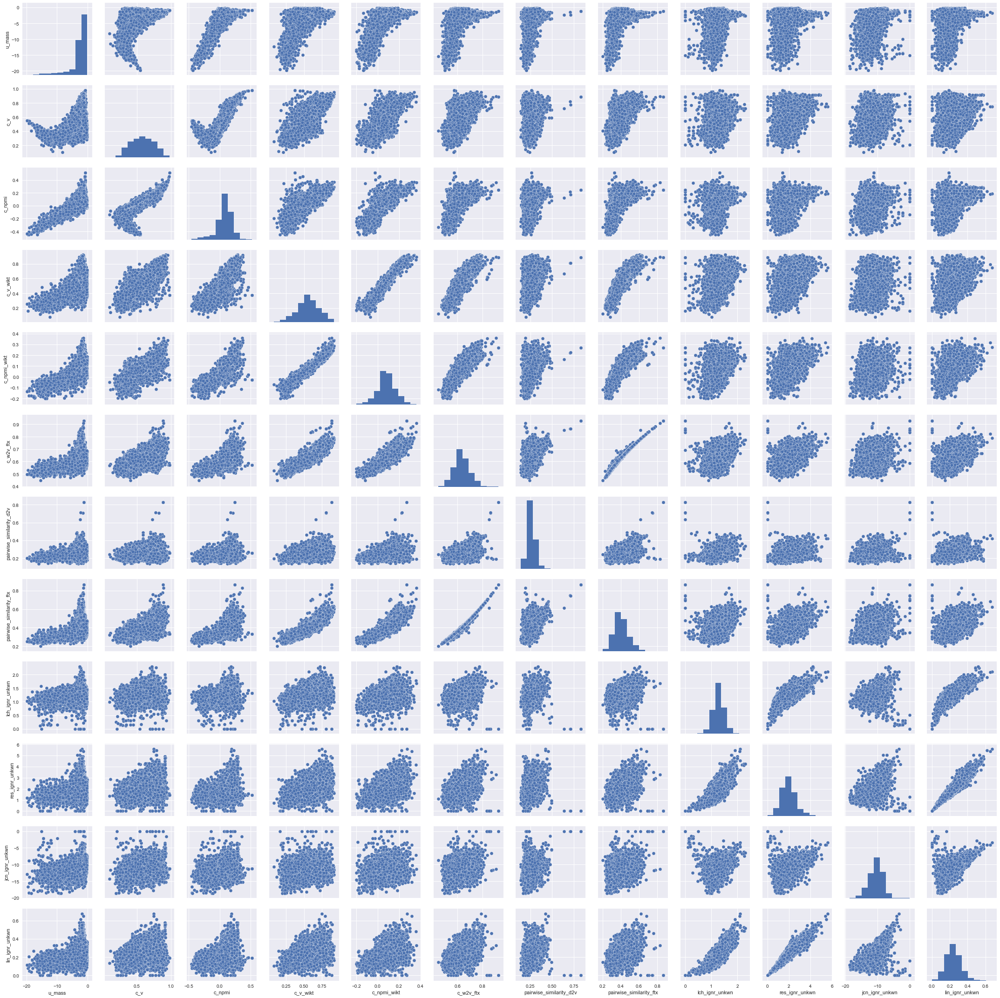

In [15]:
sns.pairplot(s_fair)

In [16]:
#from nipype.algorithms.icc import ICC_rep_anova
#ICC_rep_anova(s_fair.values.T)